In [32]:
%load_ext jupyternotify
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

filepath = "~/Documents/03 Resources/research/petrolina/EQUIDOSO_Study_IMPUTED_Dataset_2020-06-30.xlsx"
df = pd.read_excel(filepath, index_col=0)
df.loc[df['GRUPO'] == 'GC', 'Label'] = int(1)
df.loc[df['GRUPO'] == 'GE', 'Label'] = int(0)
df['Label'] = df['Label'].astype('int64')

data = df.drop(labels=['GRUPO', 'SEXO', 'Label'], axis=1).values
target = df["Label"].values

The jupyternotify extension is already loaded. To reload it, use:
  %reload_ext jupyternotify


In [2]:
df.columns

Index(['GRUPO', 'SEXO', 'IDADE', 'MASSA', 'ESTATURA', 'IMC',
       'Gait_Speed_TS_T0', 'Gait_Speed_TS_T3', 'Gait_Speed_TS_T6',
       'Gait_Speed_TS_T9',
       ...
       'StroopColor_ortost_T3', 'StroopColor_ortost_T6',
       'StroopColor_ortost_T9', 'StroopColor_ortost_T12',
       'StroopColorEffectOrt_T0', 'StroopColorEffectOrt_T3',
       'StroopColorEffectOrt_T6', 'StroopColorEffectOrt_T9',
       'StroopColorEffectOrt_T12', 'Label'],
      dtype='object', length=392)

# SOMPY 
- Exploring variable values.
- A rule of thumb is to generate several models with different parameters and choose the one which, having a topographic error very near to zero, has the lowest quantization error. It is important to hold the topographic error very low in order to make the components smooth and easy to understand.

In [36]:
import sompy

iterations=500
mapsize = [5, 8]
df_minor = df.filter(regex='T0')
data = df_minor.values

som = sompy.SOMFactory.build(
    data, mapsize, mask=None, mapshape='planar', 
    normalization='var', initialization='pca', 
    neighborhood='gaussian', training='batch', 
    name='sompy', lattice='hexa',
    component_names=list(df_minor.columns)
)

som.train(
    n_job=4, verbose=False, train_finetune_len=100, train_rough_len=iterations,
)

topographic_error = som.calculate_topographic_error()
quantization_error = np.mean(som._bmu[1])
print ("Topographic error = %s; Quantization error = %s" % (topographic_error, quantization_error))

Topographic error = 0.9666666666666667; Quantization error = 6.521167276085554


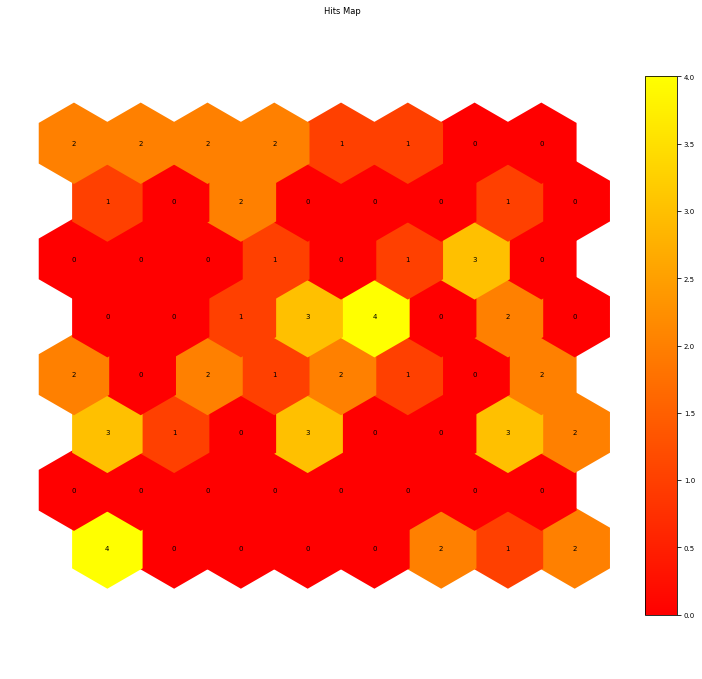

In [37]:
from sompy.visualization.bmuhits import BmuHitsView
#sm.codebook.lattice="rect"
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="autumn", logaritmic=False)
plt.show()

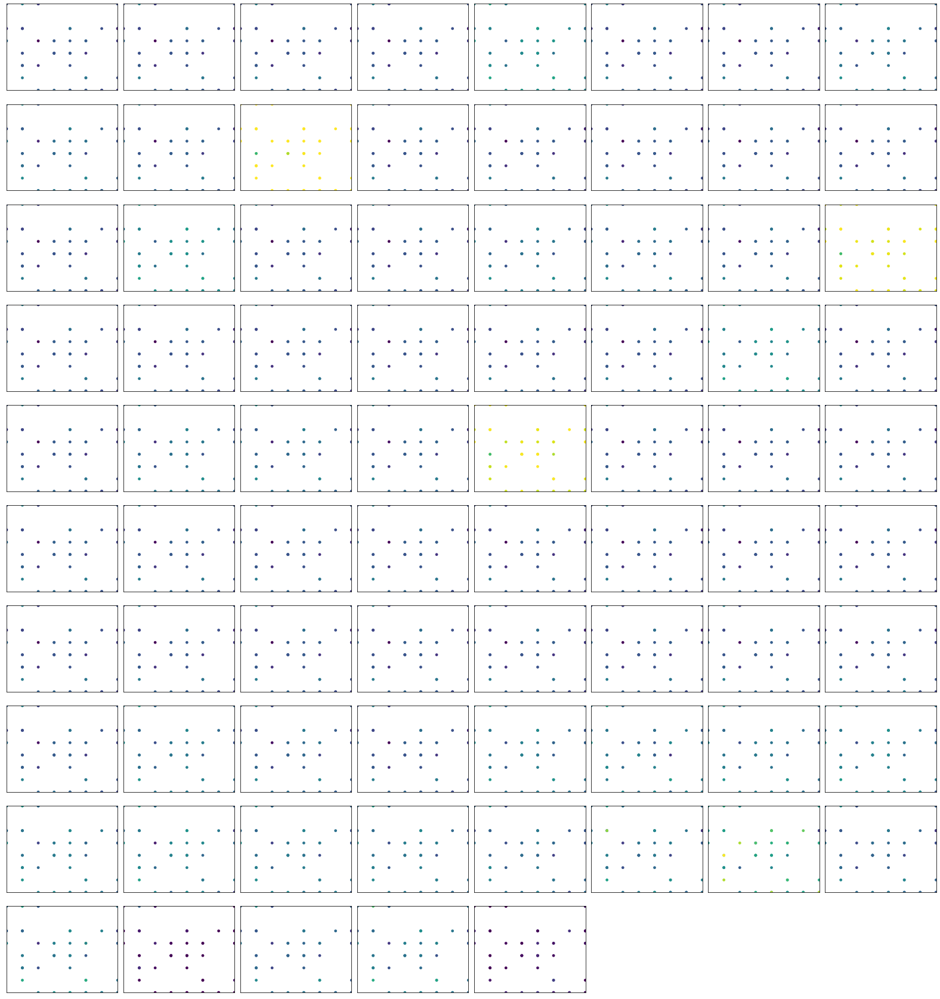

In [48]:
from sompy.visualization.dotmap import DotMapView

vhts  = DotMapView(10,10,"Dot Map",text_size=10)
vhts.show(som)

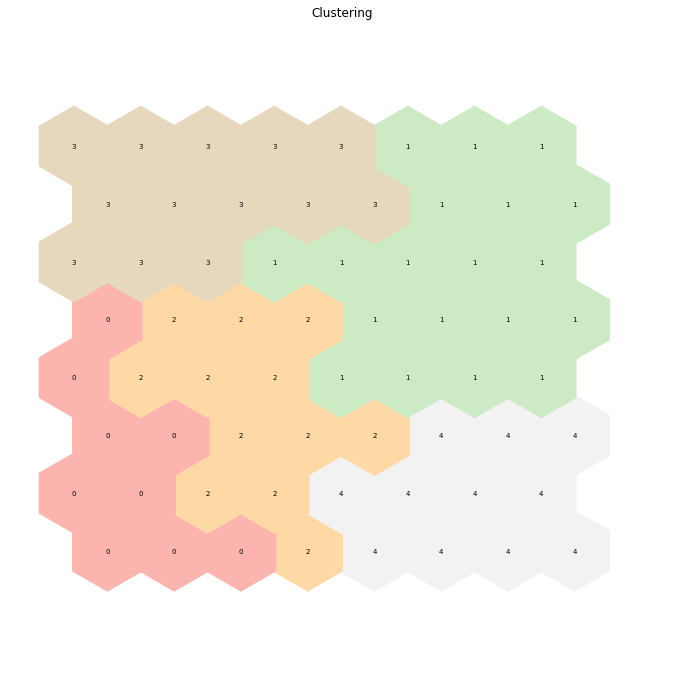

In [50]:
from sompy.visualization.hitmap import HitMapView
som.cluster(5)

hits  = HitMapView(12, 12,"Clustering", text_size=10, cmap=plt.cm.jet)
a = hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

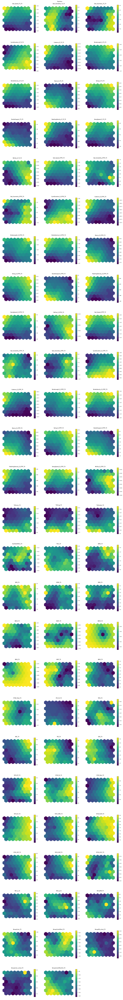

In [47]:
from sompy.visualization.mapview import View2D
view2D  = View2D(10,10,"Equidoso", text_size=7)
view2D.show(som, col_sz=3, which_dim="all", denormalize=True)
plt.show()

In [14]:
som.calculate_map_size('hexa')

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/sompy.py:647: RuntimeWarning: invalid value encountered in add
/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/sompy.py:673: ComplexWarning: Casting complex values to real discards the imaginary part


[5, 8]

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:48: UserWarning: No contour levels were found within the data range.
/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:73: RuntimeWarning: divide by zero encountered in true_divide
/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/skimage/feature/peak.py:39: RuntimeWarning: invalid value encountered in greater
  mask &= image > threshold


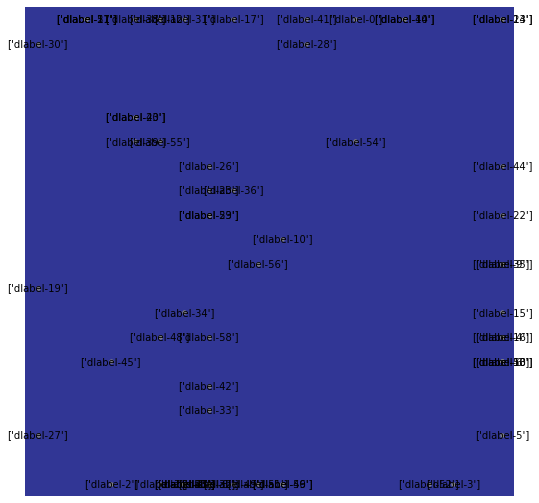

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


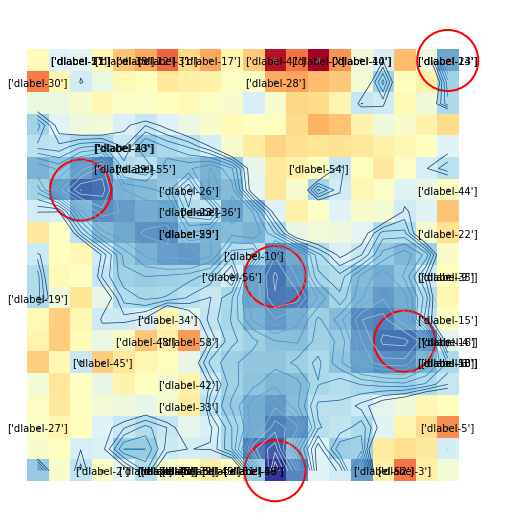

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


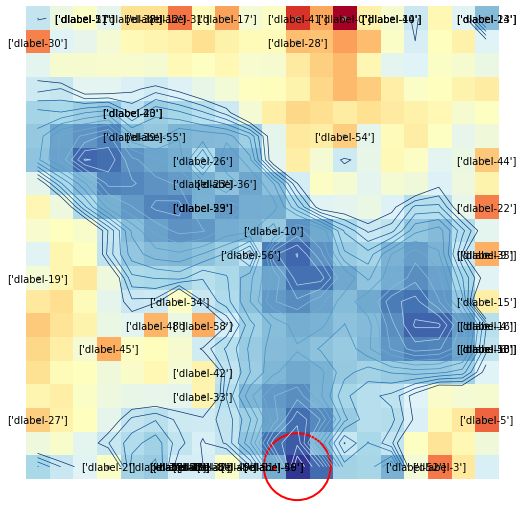

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


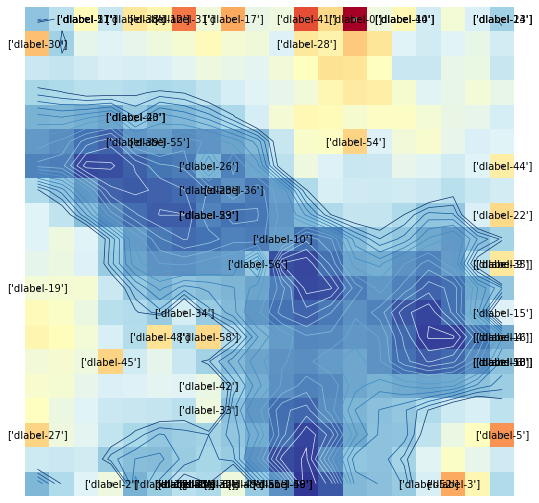

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


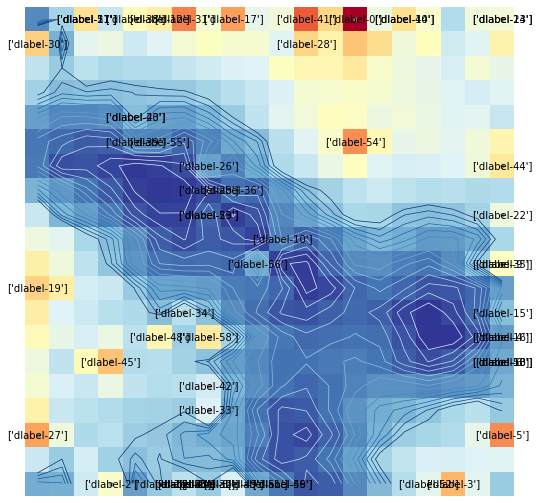

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


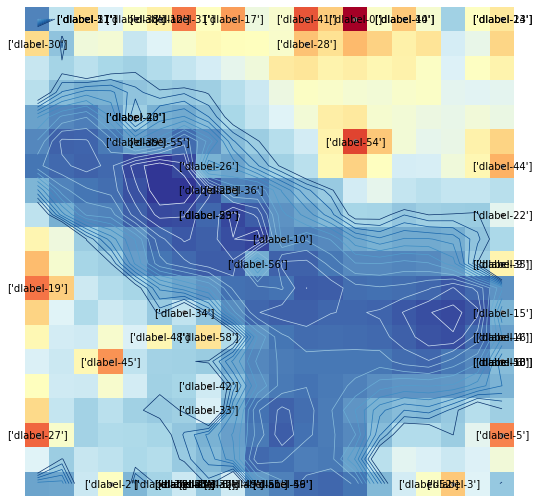

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


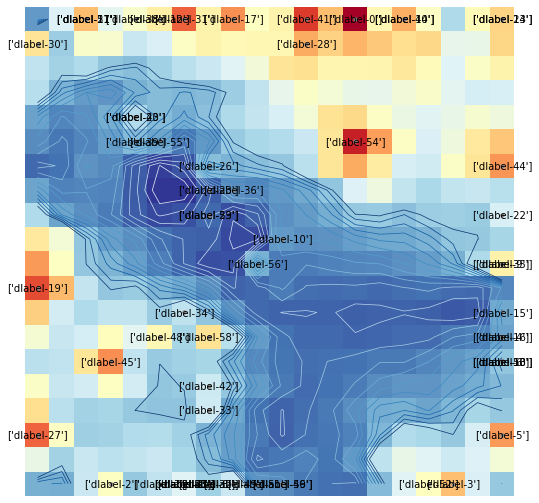

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


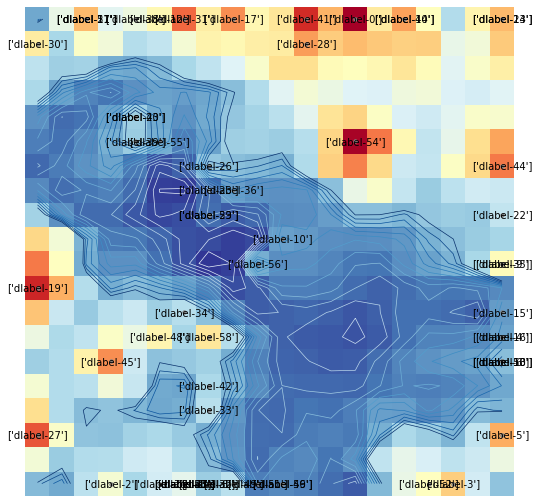

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


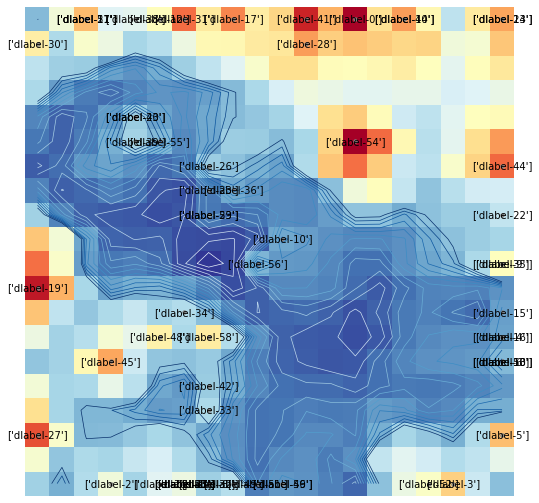

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


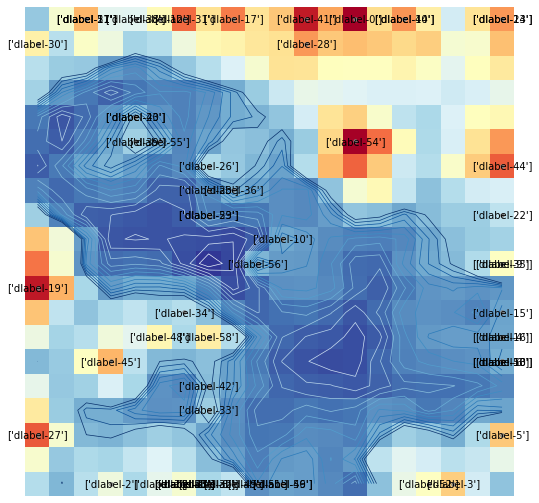

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


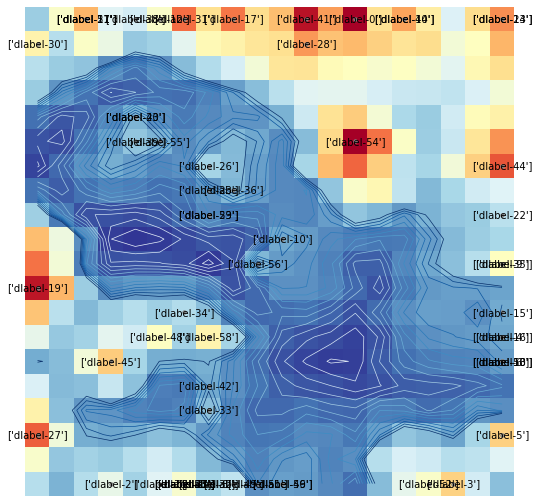

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


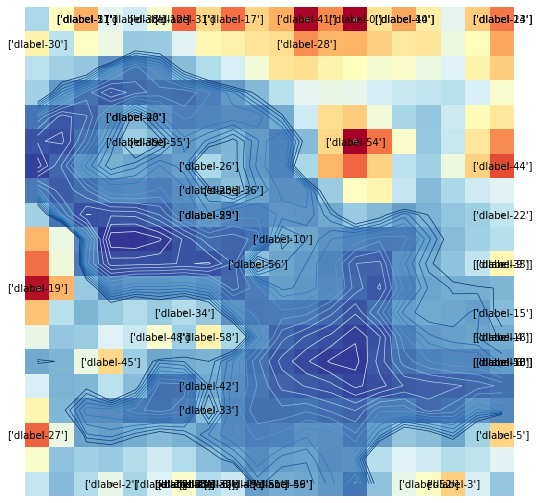

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


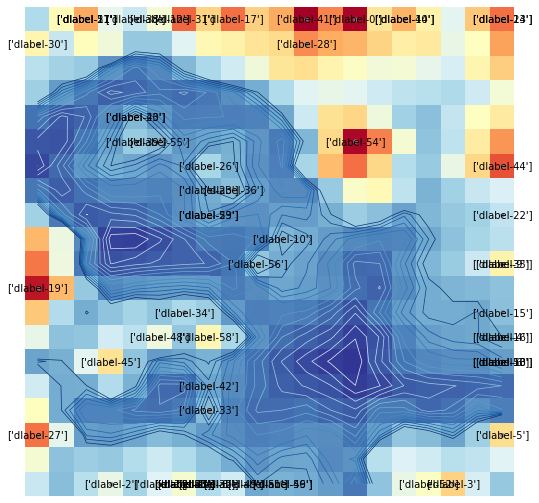

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


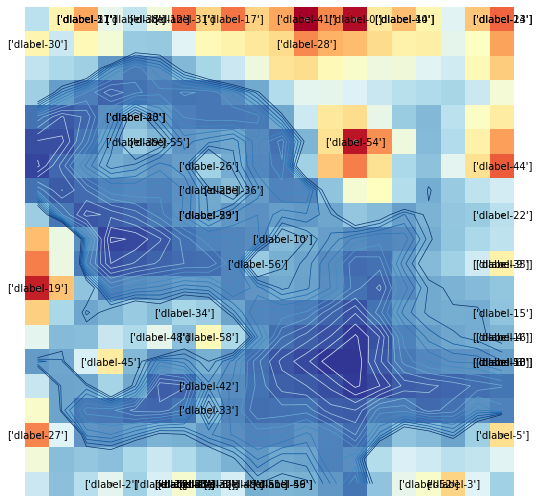

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


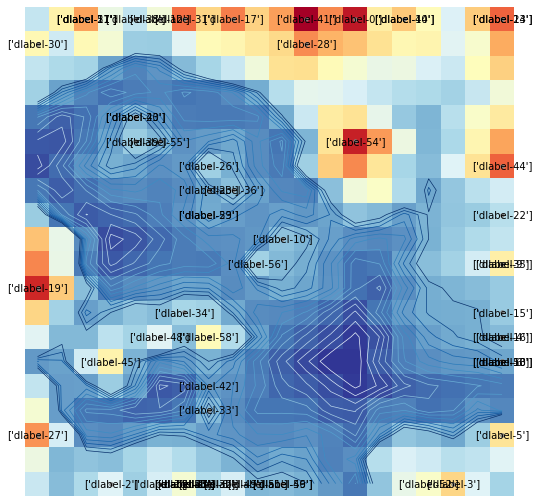

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


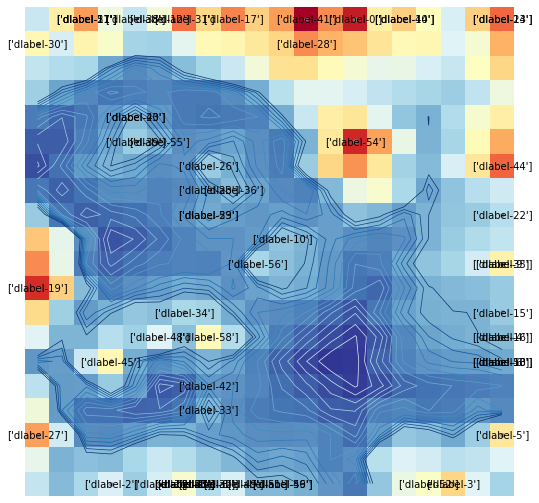

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


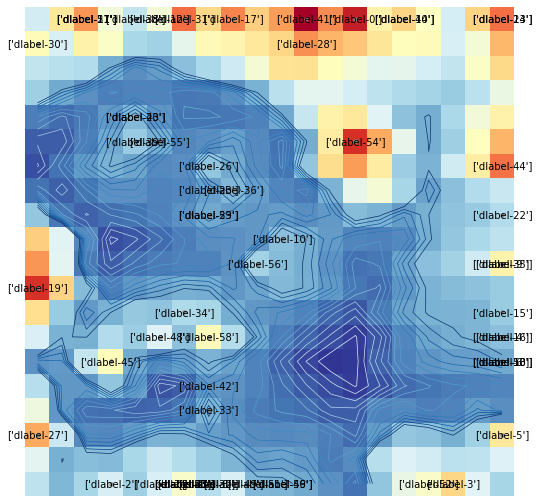

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


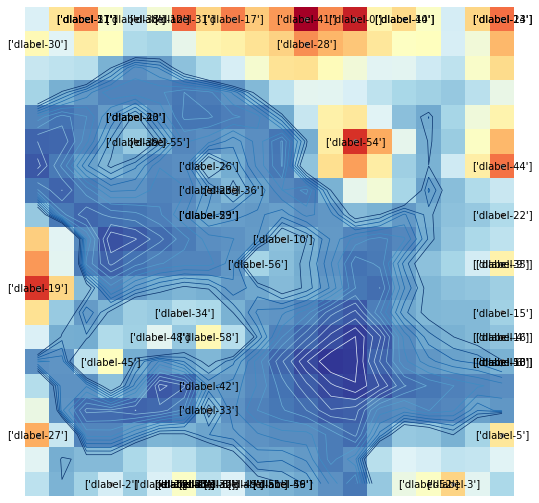

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


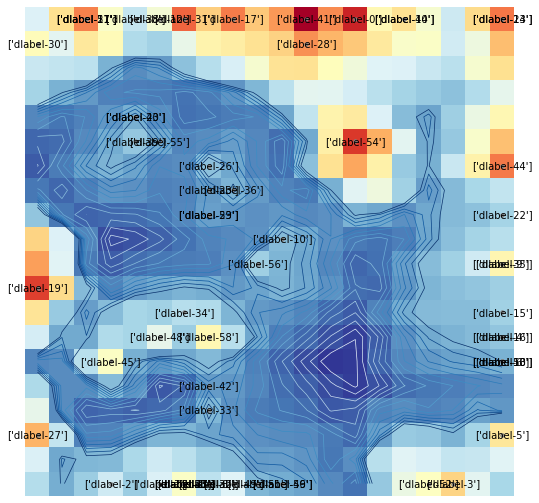

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


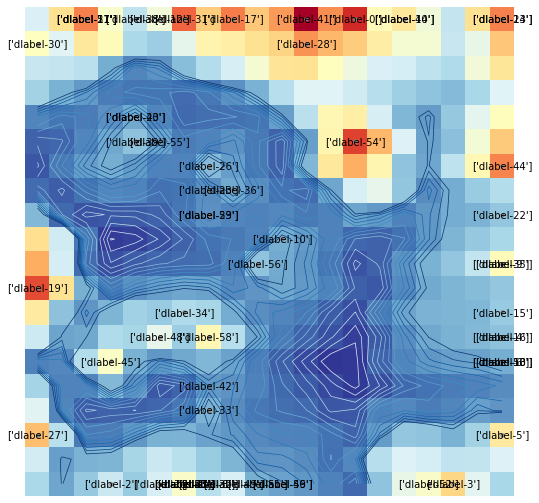

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


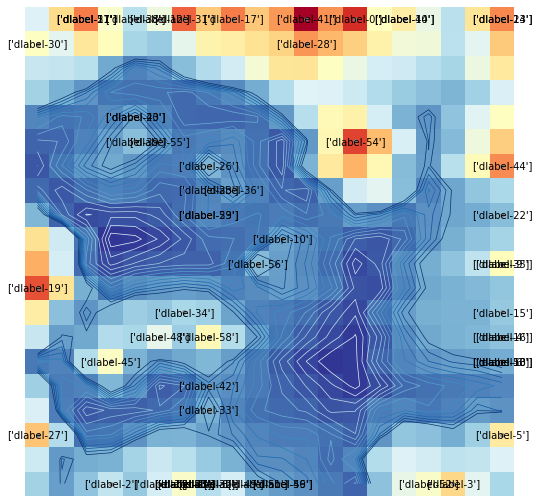

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


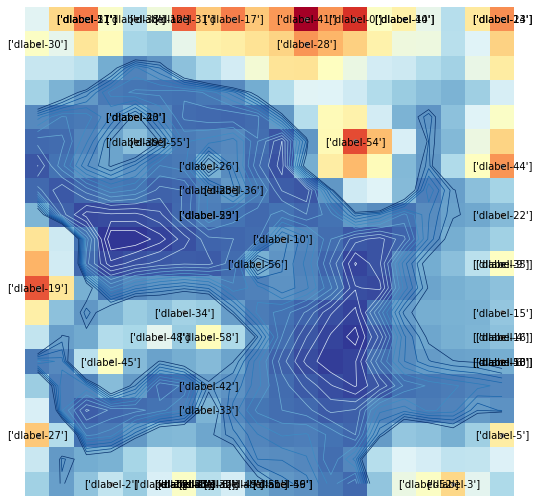

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


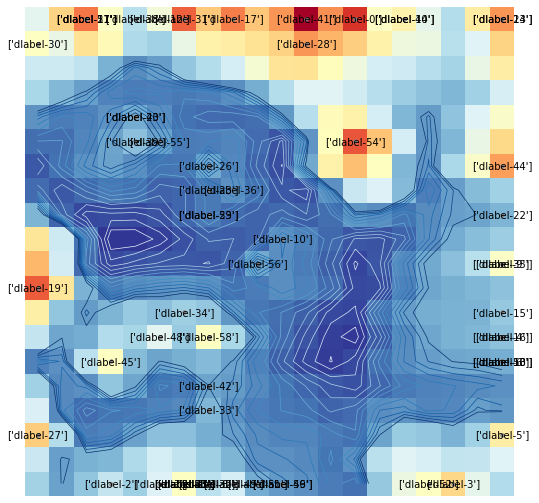

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


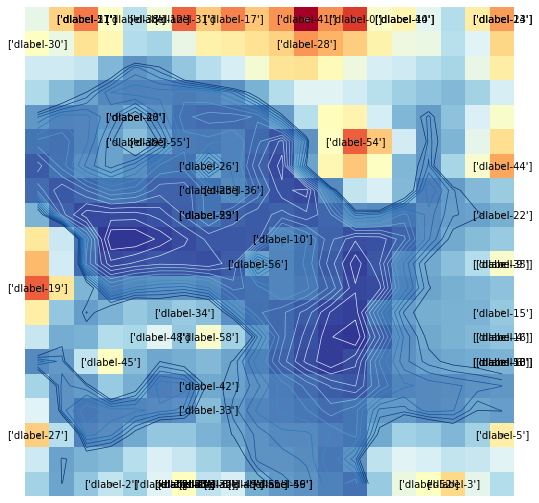

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


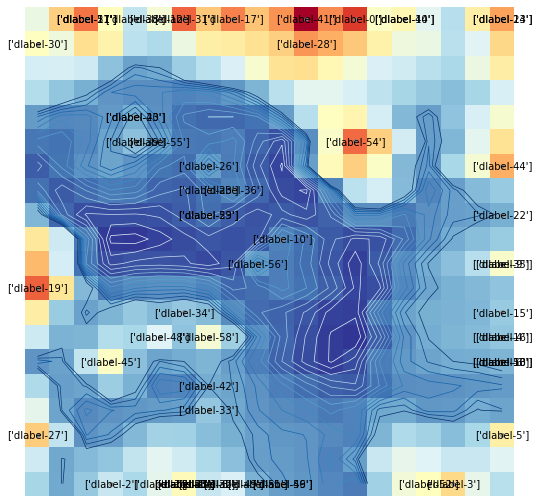

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


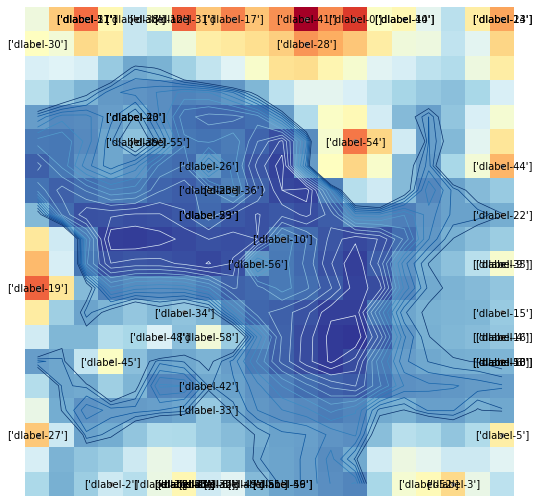

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


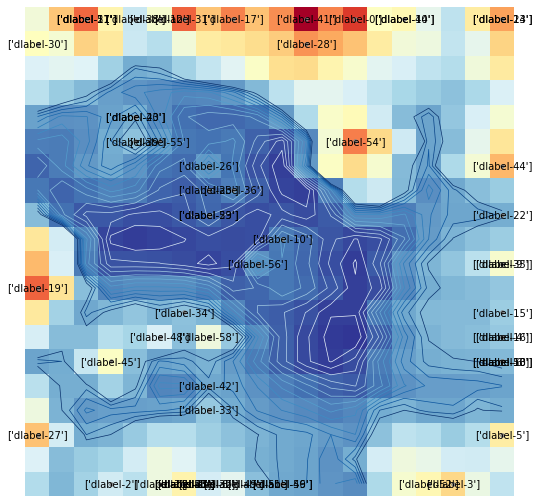

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


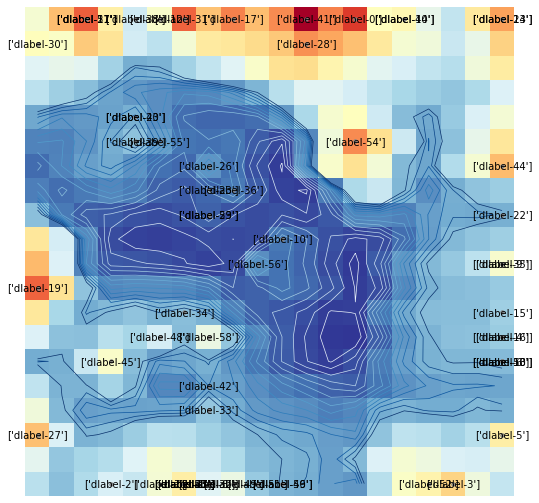

/home/sarai/.virtualenvs/relief/lib/python3.7/site-packages/SOMPY-1.1-py3.7.egg/sompy/visualization/umatrix.py:74: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


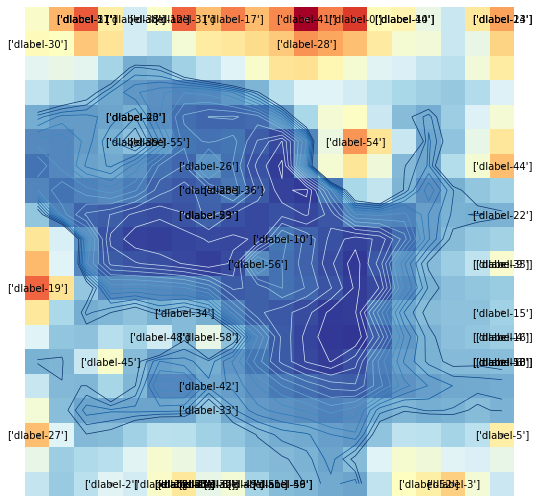

In [11]:
from sompy.visualization.umatrix import UMatrixView

for i in range(1, 30):
    vhts  = UMatrixView(12,12,"UMatrix",text_size=7)
    vhts.show(som, distance2=i, blob=True, labels=True)
    plt.show()

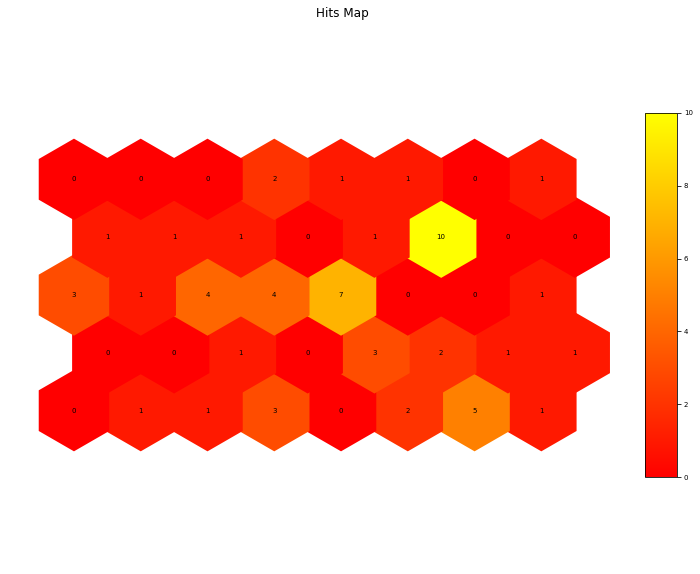

In [16]:
from sompy.visualization.bmuhits import BmuHitsView
#sm.codebook.lattice="rect"
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="autumn", logaritmic=False)
plt.show()

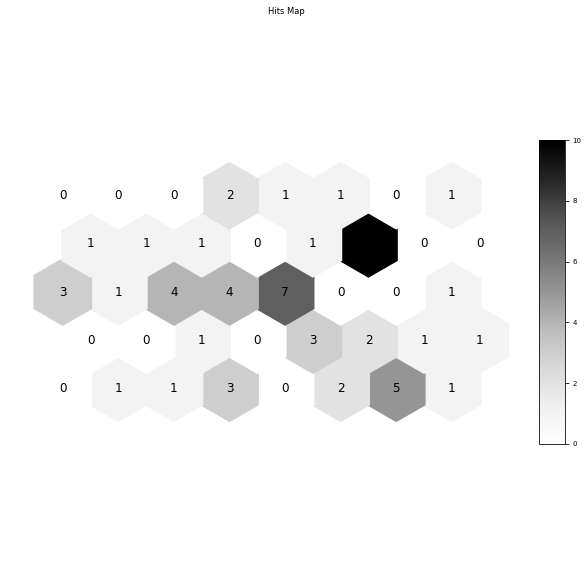

In [18]:
from sompy.visualization.bmuhits import BmuHitsView

vhts  = BmuHitsView(10,10,"Hits Map",text_size=7)
vhts.show(som, anotate=True, onlyzeros=False, labelsize=12, cmap="Greys", logaritmic=False)

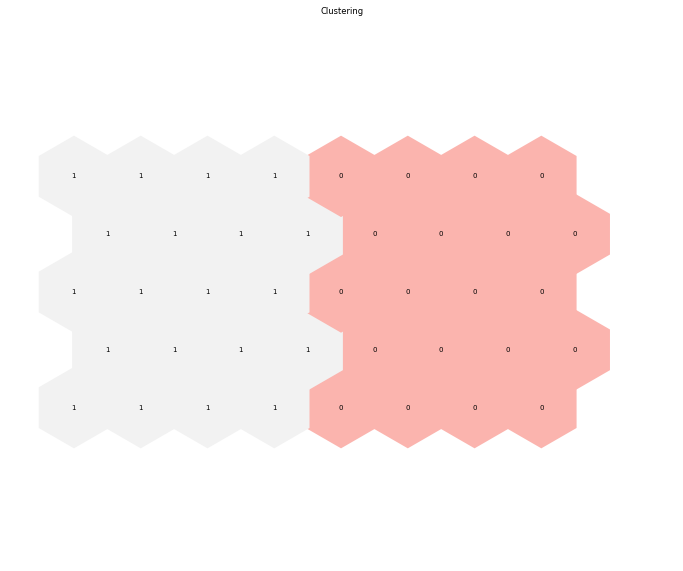

In [26]:
from sompy.visualization.hitmap import HitMapView
som.cluster(2)

hits  = HitMapView(12, 12,"Clustering", text_size=10, cmap=plt.cm.jet)
a = hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

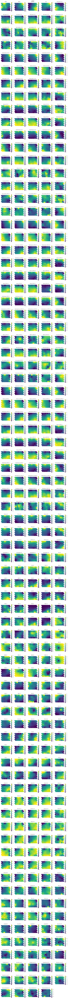

In [10]:
from sompy.visualization.mapview import View2D
view2D  = View2D(10,10,"Equidoso", text_size=7)
view2D.show(som, col_sz=5, which_dim="all", denormalize=True)
plt.show()